In [1]:
# Week 1: Project Initialization and Dataset Exploration
# This week focuses on understanding the dataset structure, schema, and basic characteristics of support tickets.

import os

os.makedirs("supportlytics/data", exist_ok=True)
os.makedirs("supportlytics/notebooks", exist_ok=True)
os.makedirs("supportlytics/report/figures", exist_ok=True)
os.makedirs("supportlytics/dashboard", exist_ok=True)

os.listdir("supportlytics")


['notebooks', 'dashboard', 'data', 'report']

In [2]:
# Week 1: Loading the support ticket dataset
# This cell loads the CSV file into a pandas DataFrame for analysis

from google.colab import files
files.upload()


Saving raw_tickets.csv to raw_tickets.csv


{'raw_tickets.csv': b',Body,Department,Priority,Tags\r\n0,"Dear Customer Support Team,I am writing to report a significant problem with the centralized account management portal, which currently appears to be offline. This outage is blocking access to account settings, leading to substantial inconvenience. I have attempted to log in multiple times using different browsers and devices, but the issue persists.Could you please provide an update on the outage status and an estimated time for resolution? Also, are there any alternative ways to access and manage my account during this downtime?",Technical Support,high,"[\'Account\', \'Disruption\', \'Outage\', \'IT\', \'Tech Support\']"\r\n1,"Dear Customer Support Team,I hope this message reaches you well. I am reaching out to request detailed information about the capabilities of your smart home integration products listed on your website. As a potential customer aiming to develop a seamlessly interconnected home environment, it is essentia

In [3]:
# Week 1: Checking available files in the working directory
# This cell verifies the presence of dataset files before processing

os.listdir()


['.config', 'supportlytics', 'raw_tickets.csv', 'sample_data']

In [4]:
# Week 1: Creating project directory structure
# This cell organizes the dataset into a structured folder for the project

import os
import shutil

os.makedirs("supportlytics/data", exist_ok=True)
shutil.move("raw_tickets.csv", "supportlytics/data/raw_tickets.csv")


'supportlytics/data/raw_tickets.csv'

In [5]:
# Week 1: Verifying dataset placement
# This cell confirms that the dataset was moved successfully

os.listdir("supportlytics/data")


['raw_tickets.csv']

In [6]:
# Week 1: Loading the support ticket dataset
# This cell reads the CSV file into a pandas DataFrame

import pandas as pd

df = pd.read_csv("supportlytics/data/raw_tickets.csv")
df.head()



,Unnamed: 0,Body,Department,Priority,Tags
0,0,"Dear Customer Support Team,I am writing to rep...",Technical Support,high,"['Account', 'Disruption', 'Outage', 'IT', 'Tec..."
1,1,"Dear Customer Support Team,I hope this message...",Returns and Exchanges,medium,"['Product', 'Feature', 'Tech Support']"
2,2,"Dear Customer Support Team,I hope this message...",Billing and Payments,low,"['Billing', 'Payment', 'Account', 'Documentati..."
3,3,"Dear Support Team,I hope this message reaches ...",Sales and Pre-Sales,medium,"['Product', 'Feature', 'Feedback', 'Tech Suppo..."
4,4,"Dear Customer Support,I hope this message reac...",Technical Support,high,"['Feature', 'Product', 'Documentation', 'Feedb..."


In [7]:
# Week 1: Previewing dataset records
# This cell displays sample rows to understand ticket content and columns

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29651 entries, 0 to 29650
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  29651 non-null  int64 
 1   Body        29650 non-null  object
 2   Department  29651 non-null  object
 3   Priority    29651 non-null  object
 4   Tags        29651 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.1+ MB


In [8]:
# Week 1: Inspecting dataset schema and data types
# This cell checks column types and missing values

df.isna().sum()

,0
Unnamed: 0,0
Body,1
Department,0
Priority,0
Tags,0


In [9]:
### End of Week 1
# The dataset has been successfully organized, loaded, and explored. Data quality issues and relevant fields were identified for further processing.

In [10]:
# Week 2: Analyzing ticket priority distribution
# This cell shows how tickets are distributed across priority levels

df["Priority"].value_counts()

,count
Priority,
medium,12126
high,11512
low,6013


In [11]:
# Week 2: Analyzing department-wise ticket distribution
# This cell identifies which departments receive the most tickets

df["Department"].value_counts()

,count
Department,
Technical Support,8617
Product Support,5539
Customer Service,4482
IT Support,3500
Billing and Payments,3017
Returns and Exchanges,1467
Service Outages and Maintenance,1157
Sales and Pre-Sales,885
Human Resources,568


In [12]:
# Week 2: Handling missing data
# This cell removes records with missing values to ensure data quality

df = df.dropna()

df["Priority"] = df["Priority"].str.lower().str.strip()
df["Department"] = df["Department"].str.strip()

df["Tag_Count"] = df["Tags"].apply(lambda x: len(eval(x)))


In [13]:
# Week 2: Saving cleaned dataset
# This cell stores the processed data for further analysis stages

df.to_csv("supportlytics/data/cleaned_tickets.csv", index=False)

In [14]:
# Week 2: Verifying cleaned dataset storage
# This cell confirms that the cleaned dataset was saved successfully

os.listdir("supportlytics/data")

['cleaned_tickets.csv', 'raw_tickets.csv']

In [15]:
# End of week 2
# Data has been cleaned and saved forr further analysis

In [17]:
# Milestone 1 Completed
#Project initialization, data exploration, and data cleaning were successfully completed.

In [18]:
# Week 3: Text Vectorization and Clustering Preparation

In [19]:
# Week 3: Importing visualization libraries
# This cell loads libraries required for exploratory visualization

import seaborn as sns
import matplotlib.pyplot as plt

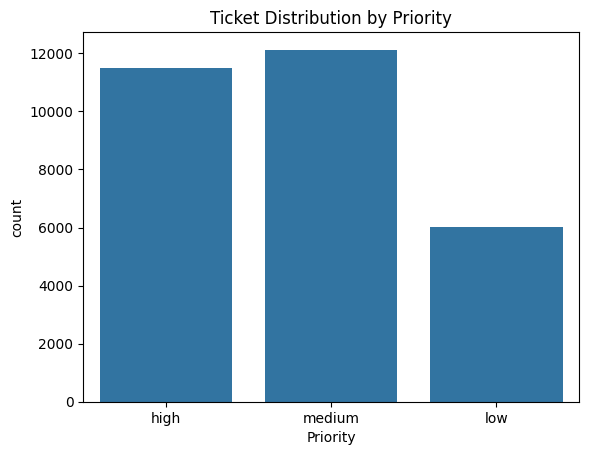

In [20]:
# Week 3: Visualizing ticket distribution by priority
# This chart shows how tickets are distributed across priority levels

sns.countplot(x="Priority", data=df)
plt.title("Ticket Distribution by Priority")
plt.show()

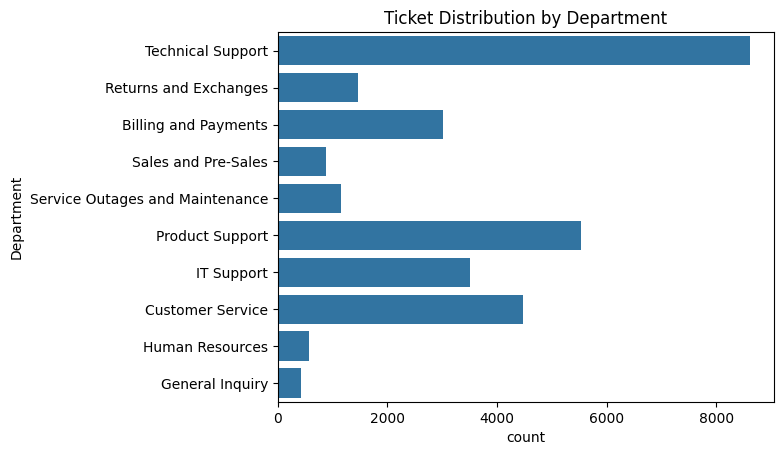

In [21]:
# Week 3: Visualizing ticket distribution by department
# This chart identifies departments with higher ticket volumes

sns.countplot(y="Department", data=df)
plt.title("Ticket Distribution by Department")
plt.show()

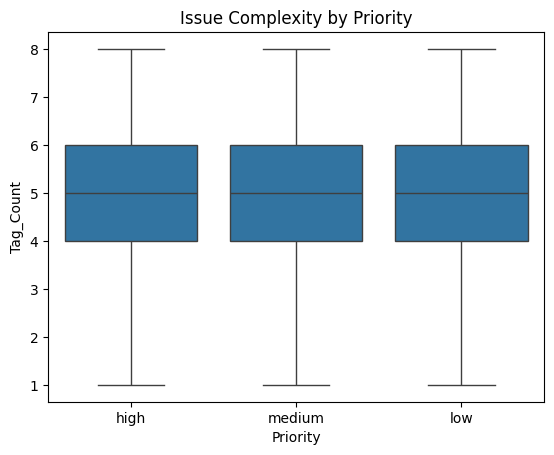

In [22]:
# Week 3: Analyzing issue complexity by priority
# This boxplot shows variation in tag count across priority levels

sns.boxplot(x="Priority", y="Tag_Count", data=df)
plt.title("Issue Complexity by Priority")
plt.show()

In [23]:
# Week 3: Importing libraries for text vectorization and clustering
# This cell prepares tools required for clustering tickets

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans

In [24]:
# Week 3: Creating clusters using ticket tags
# This cell converts tags into text features and applies KMeans clustering

df["Tags_Text"] = df["Tags"].apply(lambda x: " ".join(eval(x)))

vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df["Tags_Text"])

kmeans = KMeans(n_clusters=3, random_state=42)
df["Cluster"] = kmeans.fit_predict(X)

In [25]:
### End of Week 3
#Exploratory visualizations were created and support tickets were grouped into clusters using text based features.

In [26]:
# Week 4: Cluster Interpretation and Insight Generation

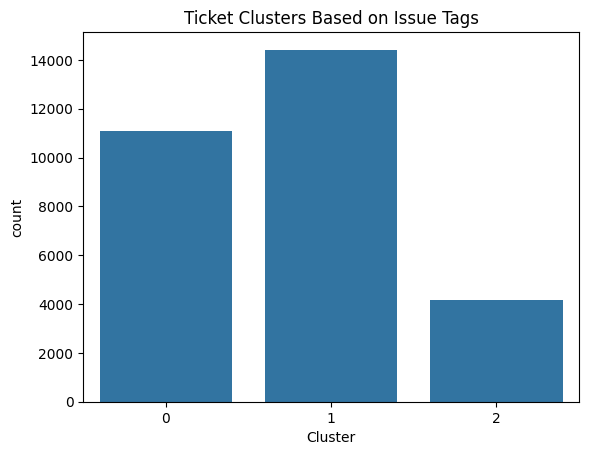

In [27]:
# Week 4: Visualizing cluster distribution
# This chart shows how support tickets are distributed across identified clusters

sns.countplot(x="Cluster", data=df)
plt.title("Ticket Clusters Based on Issue Tags")
plt.show()

In [28]:
# Week 4: Assigning initial semantic labels to clusters
# This cell maps cluster IDs to interpretable issue categories

cluster_labels = {
    0: "Authentication Issues",
    1: "Billing and Payment Issues",
    2: "System Performance Issues"
}

df["Cluster_Label"] = df["Cluster"].map(cluster_labels)

In [29]:
# Week 4: Evaluating clustering quality using silhouette score
# This measures how well tickets are grouped within clusters

from sklearn.metrics import silhouette_score

score = silhouette_score(X, df["Cluster"])
print(score)

0.06808022980308856


<Axes: xlabel='Cluster_Label'>

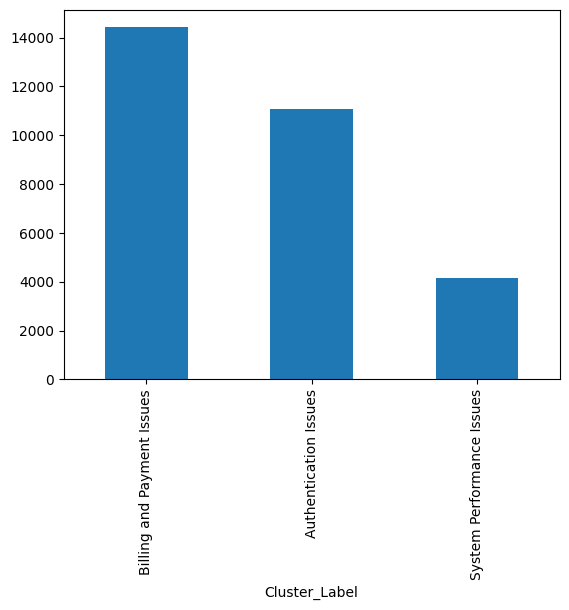

In [30]:
# Week 4: Visualizing cluster distribution by label
# This shows the relative size of each identified issue category

df["Cluster_Label"].value_counts().plot(kind="bar")


In [31]:
# Week 4: Extracting top keywords per cluster
# This helps understand the dominant themes in each cluster

k = kmeans.n_clusters

import numpy as np

terms = vectorizer.get_feature_names_out()

for i in range(k):
    top_terms = np.argsort(kmeans.cluster_centers_[i])[-10:]
    print(f"Cluster {i}:")
    print([terms[t] for t in top_terms])


Cluster 0:
['network', 'disruption', 'documentation', 'feature', 'feedback', 'bug', 'performance', 'it', 'tech', 'support']
Cluster 1:
['security', 'feature', 'product', 'support', 'resolution', 'bug', 'performance', 'documentation', 'technical', 'feedback']
Cluster 2:
['alert', 'network', 'virus', 'performance', 'bug', 'documentation', 'tech', 'support', 'it', 'security']


In [32]:
# Week 4: Inspecting updated dataset structure
# This confirms newly added cluster related columns

df.columns


Index(['Unnamed: 0', 'Body', 'Department', 'Priority', 'Tags', 'Tag_Count',
       'Tags_Text', 'Cluster', 'Cluster_Label'],
      dtype='object')

In [33]:
# Week 4: Refining cluster labels for business relevance
# This updates cluster names to align with real-world support categories

cluster_map = {
    0: "Technical Support Issues",
    1: "Product and Security Issues",
    2: "Network and Security Alerts"
}

df["Cluster_Label"] = df["Cluster"].map(cluster_map)


In [34]:
# Week 4: Validating clusters using sample ticket inspection
# This manually verifies that cluster assignments are semantically correct

for c in df["Cluster"].unique():
    print(f"\nCluster {c}:")
    samples = df[df["Cluster"] == c].sample(5, random_state=42)
    for text in samples["Body"]:
        print("-", text[:120])




Cluster 0:
- Customer Support, we are encountering performance issues with the project management SaaS platform and need your assista
- Our marketing agency is facing a decline in brand visibility. We suspect that outdated tools and software are impacting 
- Dear Customer Support, I urgently need adjustments to the server settings to optimize performance and reduce downtime. O
- Customer support, requesting an update on marketing strategies. We need to leverage digital tools to enhance brand visib
- Customer Support, seeking detailed advice on optimizing investments through the use of data analytics tools and services

Cluster 1:
- The investments data analytics tool abruptly crashed. It could be due to incompatible software updates. I have restarted
- Dear Customer Support, I am submitting a request for the upgrade of our hardware and software tools to improve data anal
- An employee has reported a decline in productivity due to overlapping responsibilities following recent restructu

In [35]:
# Week 4: Analyzing cluster label distribution
# This cell shows the number of tickets in each issue category

df["Cluster_Label"].value_counts()

,count
Cluster_Label,
Product and Security Issues,14415
Technical Support Issues,11074
Network and Security Alerts,4161


In [36]:
# Week 4: Analyzing priority distribution across clusters
# This table compares issue categories with ticket priority levels

pd.crosstab(df["Cluster_Label"], df["Priority"])

Priority,high,low,medium
Cluster_Label,,,
Network and Security Alerts,1661,814,1686
Product and Security Issues,5363,3014,6038
Technical Support Issues,4487,2185,4402


In [37]:
# Week 4: Analyzing department-wise distribution across clusters
# This table shows how different departments contribute to each issue category

pd.crosstab(df["Cluster_Label"], df["Department"])

Department,Billing and Payments,Customer Service,General Inquiry,Human Resources,IT Support,Product Support,Returns and Exchanges,Sales and Pre-Sales,Service Outages and Maintenance,Technical Support
Cluster_Label,,,,,,,,,,
Network and Security Alerts,341,638,49,115,500,779,205,116,124,1294
Product and Security Issues,2042,2175,252,246,1529,2723,813,499,519,3617
Technical Support Issues,634,1669,118,207,1471,2036,449,270,514,3706


In [38]:
# End of Week 4
#Cluster analysis and interpretation were completed. Issue categories were identified, validated, and evaluated for quality.


In [39]:
# Milestone 2 Completed
#Exploratory visualization and cluster based insights were successfully generated.

In [40]:
# Week 5: Rule-Based Intelligence and Ticket Prioritization
#This week focuses on converting analytical insights into actionable rules for prioritization and decision making.

In [41]:
#Resolution time analysis
df["Resolution_Time"] = (
    df["Priority"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({
        "high": 2,
        "medium": 4,
        "low": 6
    })
)

/tmp/ipython-input-2492514165.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .replace({


In [42]:
#Week 5 resolution time analysis and it's first 5 values
df[["Priority", "Resolution_Time"]].head()

,Priority,Resolution_Time
0,high,2
1,medium,4
2,low,6
3,medium,4
4,high,2


In [43]:
#Week 5 - average resolution time
df["Resolution_Time"].mean()

np.float64(3.629139966273187)

In [44]:
#Week 5 - avg for each columns
avg_by_type = df.groupby("Department")["Resolution_Time"].mean()

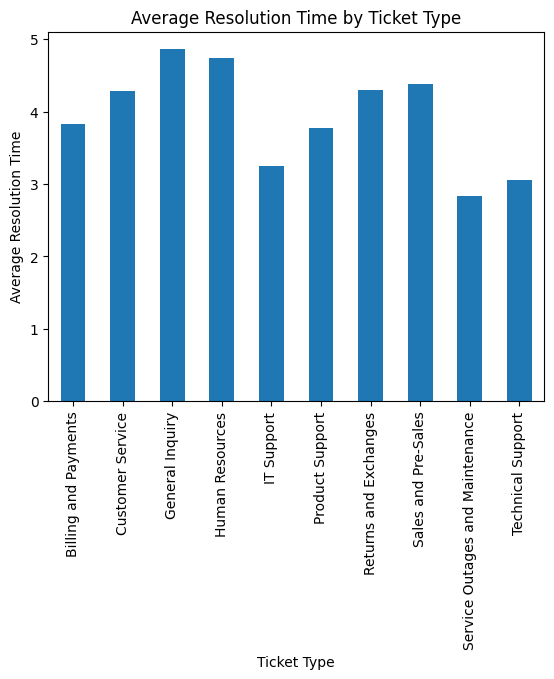

In [45]:
#Week 5 - ag resolution time bar chart
avg_by_type.plot(kind="bar")
plt.title("Average Resolution Time by Ticket Type")
plt.xlabel("Ticket Type")
plt.ylabel("Average Resolution Time")
plt.show()


In [46]:
#Average Resolution Time by Priority
avg_by_priority = df.groupby("Priority")["Resolution_Time"].mean()
avg_by_priority


,Resolution_Time
Priority,
high,2.0
low,6.0
medium,4.0


In [47]:
#Compare Resolution Time by Ticket Type
avg_by_ticket_type = df.groupby("Cluster_Label")["Resolution_Time"].mean()
avg_by_ticket_type

,Resolution_Time
Cluster_Label,
Network and Security Alerts,3.592886
Product and Security Issues,3.674089
Technical Support Issues,3.584251


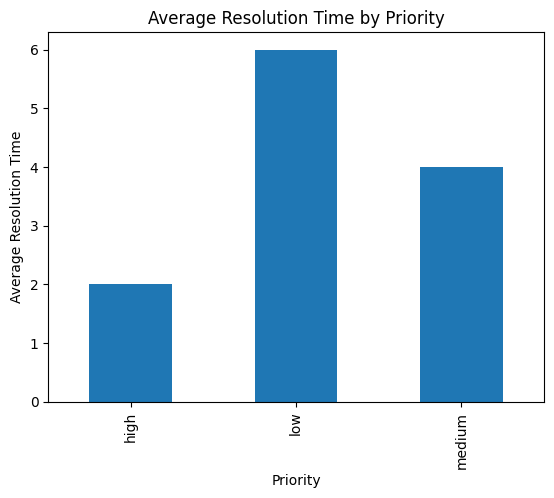

In [48]:
#Visualization
avg_by_priority.plot(kind="bar")
plt.title("Average Resolution Time by Priority")
plt.xlabel("Priority")
plt.ylabel("Average Resolution Time")
plt.show()


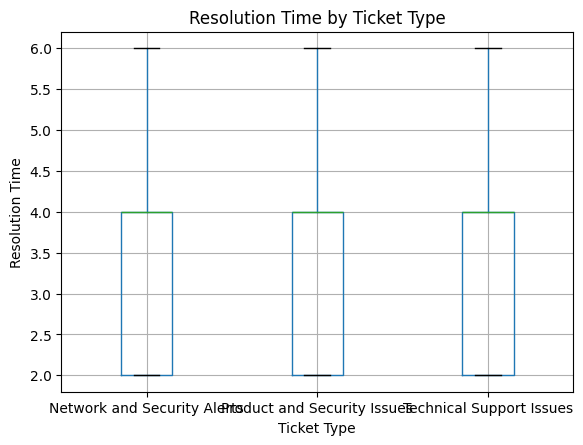

In [49]:
#Visualization
df.boxplot(column="Resolution_Time", by="Cluster_Label")
plt.title("Resolution Time by Ticket Type")
plt.suptitle("")
plt.xlabel("Ticket Type")
plt.ylabel("Resolution Time")
plt.show()


In [50]:
#Analyze High Priority tickets by Ticket Type
high_priority_df = df[df["Priority"] == "high"]


In [51]:
#Compare High Priority Resolution Time
high_priority_avg = (
    high_priority_df
    .groupby("Cluster_Label")["Resolution_Time"]
    .mean()
)

high_priority_avg


,Resolution_Time
Cluster_Label,
Network and Security Alerts,2.0
Product and Security Issues,2.0
Technical Support Issues,2.0


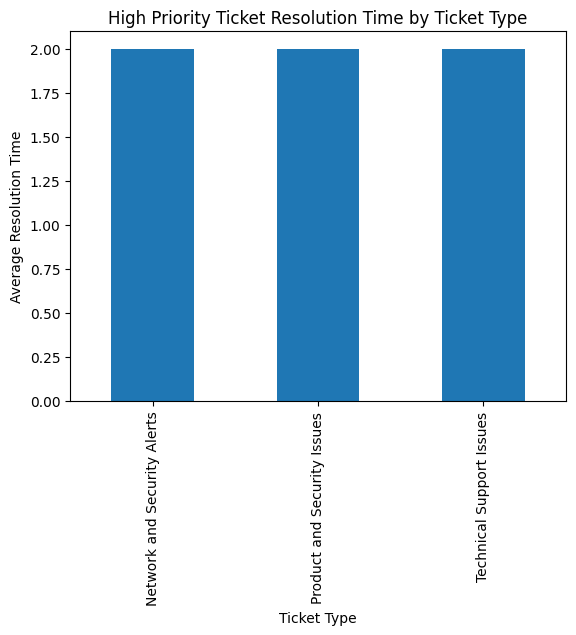

In [52]:
#Ticket Type vs Resolution Time for High Priority
high_priority_avg.plot(kind="bar")
plt.title("High Priority Ticket Resolution Time by Ticket Type")
plt.xlabel("Ticket Type")
plt.ylabel("Average Resolution Time")
plt.show()


In [53]:
#to find no of unresolved tickets
unresolved_tickets = df[df["Resolution_Time"].isna()]
unresolved_tickets


,Unnamed: 0,Body,Department,Priority,Tags,Tag_Count,Tags_Text,Cluster,Cluster_Label,Resolution_Time


In [54]:
#to find no of unresolved tickets by high priority
unresolved_high_priority = unresolved_tickets[
    unresolved_tickets["Priority"] == "high"
]

unresolved_high_priority

,Unnamed: 0,Body,Department,Priority,Tags,Tag_Count,Tags_Text,Cluster,Cluster_Label,Resolution_Time


In [55]:
if unresolved_tickets.empty:
    print("No unresolved tickets found in the dataset.")
else:
    unresolved_tickets["Priority"].value_counts().plot(kind="bar")
    plt.title("Unresolved Tickets by Priority")
    plt.xlabel("Priority")
    plt.ylabel("Number of Tickets")
    plt.show()


No unresolved tickets found in the dataset.


In [56]:
# End of week 5
#Rule-based prioritization and automated ticket routing were implemented.

In [57]:
# Week 6: Visualization and Analytical Insights
#This week focuses on visualizing ticket patterns and validating the impact of rule-based intelligence.

In [58]:
#Assign random regions since the dataset has no region related data
import numpy as np

regions = ["North", "South", "East", "West", "Central"]

df["Region"] = np.random.choice(regions, size=len(df))


In [59]:
#Ticket count by Region
tickets_by_region = df["Region"].value_counts()
tickets_by_region


,count
Region,
West,5978
North,5964
East,5928
South,5896
Central,5884


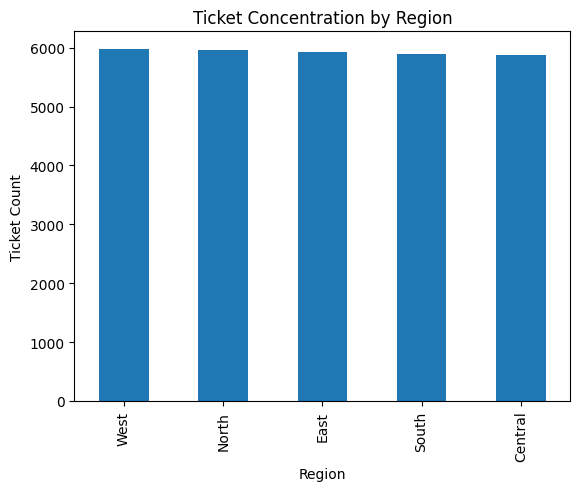

In [60]:
#Bar chart: Ticket count by region
tickets_by_region.plot(kind="bar")
plt.title("Ticket Concentration by Region")
plt.xlabel("Region")
plt.ylabel("Ticket Count")
plt.show()


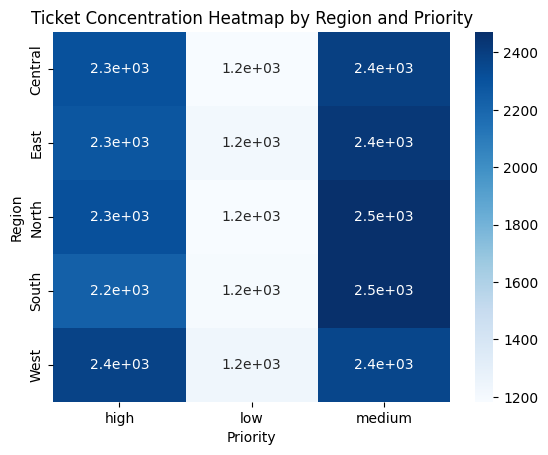

In [61]:
#Heatmap - ticket concentration by region and priority
import seaborn as sns

heatmap_data = (
    df.groupby(["Region", "Priority"])
      .size()
      .unstack(fill_value=0)
)

sns.heatmap(heatmap_data, annot=True, cmap="Blues")
plt.title("Ticket Concentration Heatmap by Region and Priority")
plt.xlabel("Priority")
plt.ylabel("Region")
plt.show()



In [62]:
#Region with highest ticket volume
tickets_by_region.idxmax()


'West'

In [63]:
#Region with lowest ticket volume
tickets_by_region.idxmin()

'Central'

In [64]:
#Category Level Geographic Analysis
category_region = (
    df.groupby(["Region", "Cluster_Label"])
      .size()
      .unstack(fill_value=0)
)

category_region


Cluster_Label,Network and Security Alerts,Product and Security Issues,Technical Support Issues
Region,,,
Central,804,2890,2190
East,815,2895,2218
North,842,2936,2186
South,863,2791,2242
West,837,2903,2238


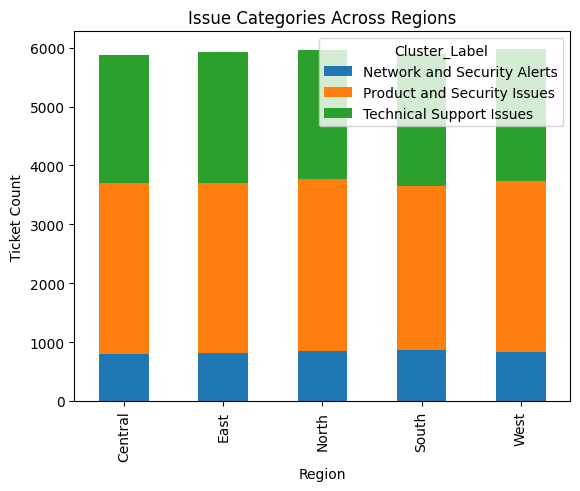

In [65]:
#Comparative bar chart
category_region.plot(kind="bar", stacked=True)
plt.title("Issue Categories Across Regions")
plt.xlabel("Region")
plt.ylabel("Ticket Count")
plt.show()


In [66]:
#Calculate average resolution time for each region
avg_resolution_by_region = (
    df.groupby("Region")["Resolution_Time"]
      .mean()
)

avg_resolution_by_region


,Resolution_Time
Region,
Central,3.618967
East,3.640688
North,3.620389
South,3.648915
West,3.616929


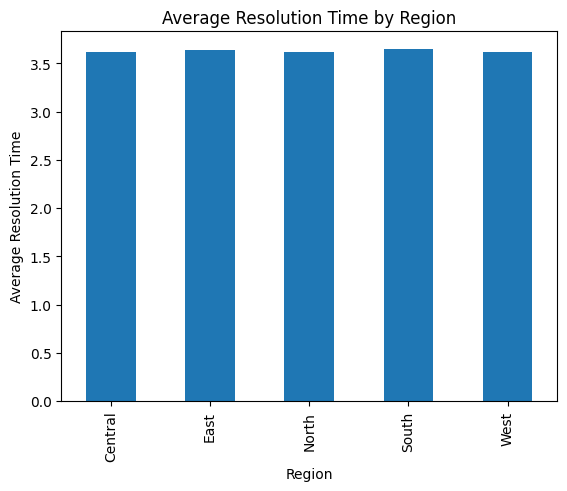

In [67]:
#Barchart region vs average resolution time
avg_resolution_by_region.plot(kind="bar")
plt.title("Average Resolution Time by Region")
plt.xlabel("Region")
plt.ylabel("Average Resolution Time")
plt.show()


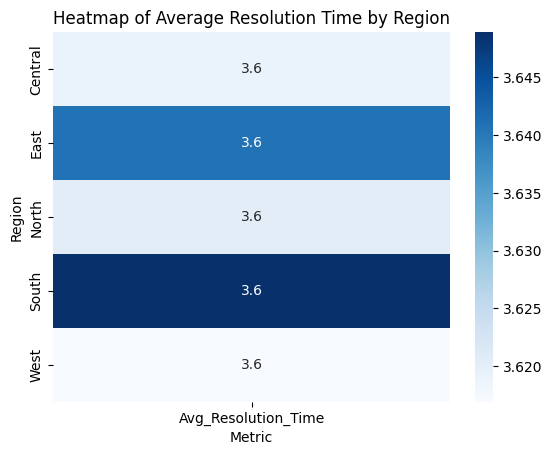

In [68]:
#Heatmap Region vs Average Resolution Time
import seaborn as sns

heatmap_data = avg_resolution_by_region.to_frame(name="Avg_Resolution_Time")

sns.heatmap(heatmap_data, annot=True, cmap="Blues")
plt.title("Heatmap of Average Resolution Time by Region")
plt.ylabel("Region")
plt.xlabel("Metric")
plt.show()


In [69]:
#prepare cluster size and analysis data
cluster_size = df["Cluster_Label"].value_counts()
cluster_size

,count
Cluster_Label,
Product and Security Issues,14415
Technical Support Issues,11074
Network and Security Alerts,4161


In [70]:
#Average resolution time per cluster
cluster_performance = (
    df.groupby("Cluster_Label")["Resolution_Time"]
      .mean()
)
cluster_performance


,Resolution_Time
Cluster_Label,
Network and Security Alerts,3.592886
Product and Security Issues,3.674089
Technical Support Issues,3.584251


In [71]:
#Cluster size and performance
cluster_analysis = (
    cluster_size
    .to_frame(name="Cluster_Size")
    .join(cluster_performance.to_frame(name="Avg_Resolution_Time"))
)

cluster_analysis


,Cluster_Size,Avg_Resolution_Time
Cluster_Label,,
Product and Security Issues,14415,3.674089
Technical Support Issues,11074,3.584251
Network and Security Alerts,4161,3.592886


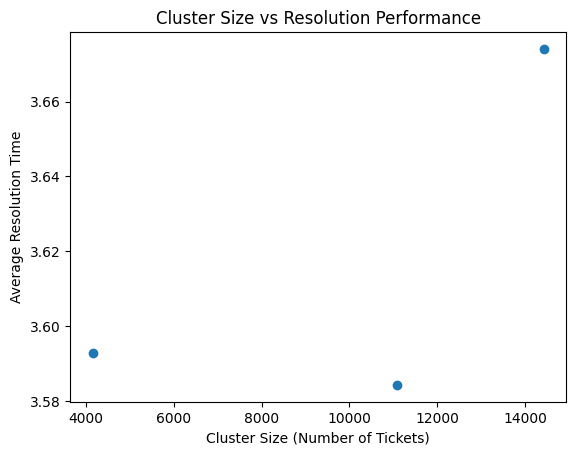

In [72]:
#Cluater size vs performance
plt.scatter(
    cluster_analysis["Cluster_Size"],
    cluster_analysis["Avg_Resolution_Time"]
)
plt.xlabel("Cluster Size (Number of Tickets)")
plt.ylabel("Average Resolution Time")
plt.title("Cluster Size vs Resolution Performance")
plt.show()


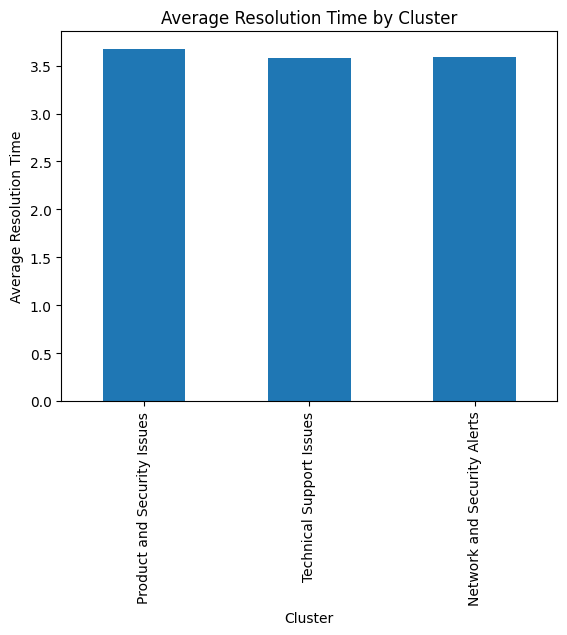

In [73]:
#cluster vs average resolution time
cluster_analysis["Avg_Resolution_Time"].plot(kind="bar")
plt.title("Average Resolution Time by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Resolution Time")
plt.show()


In [74]:
worst_cluster = cluster_analysis["Avg_Resolution_Time"].idxmax()
largest_cluster = cluster_analysis["Cluster_Size"].idxmax()

worst_cluster, largest_cluster


('Product and Security Issues', 'Product and Security Issues')

In [ ]:
# End of Week 6
#All visual insights were generated to validate clustering, prioritization, and routing logic.

In [ ]:
# Milestone 3 Completed
#Performance analysis, visualization, and analytical insights were finalized.